In [1]:
!apt-get update
!apt-get install -y libopencv-dev pkg-config


Get:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:2 https://cli.github.com/packages stable InRelease [3,917 B]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [2,205 kB]
Get:5 https://cli.github.com/packages stable/main amd64 Packages [345 B]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:7 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:8 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:9 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:10 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,851 kB]
Hit:11 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:12 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:13 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu

In [2]:
!pkg-config --modversion opencv4


4.5.4


In [3]:
from google.colab import files
files.upload()


Saving input.jpg to input.jpg


{'input.jpg': b'\xff\xd8\xff\xe1\x00\xbcExif\x00\x00II*\x00\x08\x00\x00\x00\x06\x00\x12\x01\x03\x00\x01\x00\x00\x00\x01\x00\x00\x00\x1a\x01\x05\x00\x01\x00\x00\x00V\x00\x00\x00\x1b\x01\x05\x00\x01\x00\x00\x00^\x00\x00\x00(\x01\x03\x00\x01\x00\x00\x00\x02\x00\x00\x00\x13\x02\x03\x00\x01\x00\x00\x00\x01\x00\x00\x00i\x87\x04\x00\x01\x00\x00\x00f\x00\x00\x00\x00\x00\x00\x00\xe0\x93\x04\x00\xe8\x03\x00\x00\xe0\x93\x04\x00\xe8\x03\x00\x00\x06\x00\x00\x90\x07\x00\x04\x00\x00\x000210\x01\x91\x07\x00\x04\x00\x00\x00\x01\x02\x03\x00\x00\xa0\x07\x00\x04\x00\x00\x000100\x01\xa0\x03\x00\x01\x00\x00\x00\xff\xff\x00\x00\x02\xa0\x04\x00\x01\x00\x00\x00\x00\x0e\x00\x00\x03\xa0\x04\x00\x01\x00\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\xff\xe2\x1b\x1aICC_PROFILE\x00\x01\x01\x00\x00\x1b\nlcms\x020\x00\x00mntrRGB XYZ \x07\xd4\x00\x08\x00\r\x00\x0c\x00\x12\x00\x06acspMSFT\x00\x00\x00\x00lcms\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xd6\x00\x01\x00\x00\x00\x00\xd3-lcms\x00\x0

In [4]:
!ls

input.jpg  sample_data


In [5]:
%%writefile grayscale.cu
#include <opencv2/opencv.hpp>
#include <cuda_runtime.h>
#include <iostream>
#include <chrono>

using namespace std;
using namespace cv;

/* ================= CUDA KERNEL ================= */
__global__ void grayscaleKernel(unsigned char* input,
                                unsigned char* output,
                                int width, int height)
{
    int idx = blockIdx.x * blockDim.x + threadIdx.x;

    if (idx < width * height)
    {
        int i = idx * 3;   // BGR image
        unsigned char b = input[i];
        unsigned char g = input[i + 1];
        unsigned char r = input[i + 2];

        output[idx] = (r + g + b) / 3;
    }
}

/* ================= CPU FUNCTION ================= */
void grayscaleCPU(Mat& input, Mat& output)
{
    for (int y = 0; y < input.rows; y++)
        for (int x = 0; x < input.cols; x++)
        {
            Vec3b p = input.at<Vec3b>(y, x);
            output.at<uchar>(y, x) =
                (p[0] + p[1] + p[2]) / 3;
        }
}

int main()
{
    Mat img = imread("input.jpg");
    if (img.empty())
    {
        cout << "Image not found!" << endl;
        return -1;
    }

    int width = img.cols;
    int height = img.rows;

    Mat grayCPU(height, width, CV_8UC1);
    Mat grayGPU(height, width, CV_8UC1);

    size_t imgSize = width * height * 3;
    size_t graySize = width * height;

    unsigned char *d_input, *d_output;
    unsigned char *h_output = new unsigned char[graySize];

    cudaMalloc(&d_input, imgSize);
    cudaMalloc(&d_output, graySize);

    cudaMemcpy(d_input, img.data, imgSize, cudaMemcpyHostToDevice);

    /* ---------- CPU TIME ---------- */
    auto cpuStart = chrono::high_resolution_clock::now();
    grayscaleCPU(img, grayCPU);
    auto cpuEnd = chrono::high_resolution_clock::now();

    /* ---------- GPU TIME ---------- */
    cudaEvent_t start, stop;
    cudaEventCreate(&start);
    cudaEventCreate(&stop);

    cudaEventRecord(start);

    int threads = 256;
    int blocks = (width * height + threads - 1) / threads;
    grayscaleKernel<<<blocks, threads>>>(d_input, d_output, width, height);

    cudaEventRecord(stop);
    cudaEventSynchronize(stop);

    cudaMemcpy(h_output, d_output, graySize, cudaMemcpyDeviceToHost);
    memcpy(grayGPU.data, h_output, graySize);

    float gpuTime;
    cudaEventElapsedTime(&gpuTime, start, stop);

    auto cpuTime =
        chrono::duration_cast<chrono::milliseconds>(cpuEnd - cpuStart);

    cout << "CPU Time: " << cpuTime.count() << " ms" << endl;
    cout << "GPU Time: " << gpuTime << " ms" << endl;

    imwrite("gray_cpu.jpg", grayCPU);
    imwrite("gray_gpu.jpg", grayGPU);

    delete[] h_output;
    cudaFree(d_input);
    cudaFree(d_output);

    return 0;
}


Writing grayscale.cu


In [6]:
!nvcc grayscale.cu -o grayscale `pkg-config --cflags --libs opencv4`


/usr/include/opencv4/opencv2/stitching/detail/warpers.hpp(235): warning #611-D: overloaded virtual function "cv::detail::PlaneWarper::buildMaps" is only partially overridden in class "cv::detail::AffineWarper"
  class AffineWarper : public PlaneWarper
        ^

Remark: The warnings can be suppressed with "-diag-suppress <warning-number>"

/usr/include/opencv4/opencv2/stitching/detail/warpers.hpp(235): warning #611-D: overloaded virtual function "cv::detail::PlaneWarper::warp" is only partially overridden in class "cv::detail::AffineWarper"
  class AffineWarper : public PlaneWarper
        ^

/usr/include/opencv4/opencv2/stitching/detail/blenders.hpp(100): warning #611-D: overloaded virtual function "cv::detail::Blender::prepare" is only partially overridden in class "cv::detail::FeatherBlender"
  class FeatherBlender : public Blender
        ^

/usr/include/opencv4/opencv2/stitching/detail/blenders.hpp(127): warning #611-D: overloaded virtual function "cv::detail::Blender::prepare" is

In [7]:
!./grayscale


CPU Time: 719 ms
GPU Time: 48.6945 ms


In [16]:
!rm -f grayscale gray_gpu.jpg gray_cpu.jpg
!ls

grayscale.cu  input.jpg  sample_data


In [17]:
!ls

grayscale.cu  input.jpg  sample_data


(np.float64(-0.5), np.float64(3583.5), np.float64(5375.5), np.float64(-0.5))

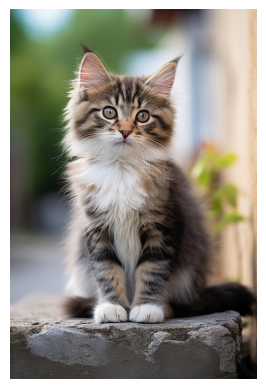

In [18]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open("input.jpg")
plt.imshow(img)
plt.axis("off")


In [19]:
%%writefile grayscale.cu
#include <opencv2/opencv.hpp>
#include <cuda_runtime.h>
#include <iostream>
#include <chrono>

using namespace std;
using namespace cv;

/* ================= CUDA KERNEL ================= */
__global__ void grayscaleKernel(unsigned char* input,
                                unsigned char* output,
                                int width, int height)
{
    int idx = blockIdx.x * blockDim.x + threadIdx.x;
    if (idx < width * height)
    {
        int i = idx * 3;
        unsigned char b = input[i];
        unsigned char g = input[i + 1];
        unsigned char r = input[i + 2];
        output[idx] = (r + g + b) / 3;
    }
}

int main()
{
    /* -------- Load image safely -------- */
    Mat img = imread("input.jpg", IMREAD_COLOR);
    if (img.empty())
    {
        cout << "Image not found!" << endl;
        return -1;
    }

    if (img.type() != CV_8UC3)
        img.convertTo(img, CV_8UC3);

    int width  = img.cols;
    int height = img.rows;

    Mat grayGPU(height, width, CV_8UC1);

    size_t imgSize  = width * height * 3;
    size_t graySize = width * height;

    unsigned char *d_input, *d_output;
    unsigned char *h_output = new unsigned char[graySize];

    memset(h_output, 255, graySize);   // proof buffer

    cudaMalloc(&d_input, imgSize);
    cudaMalloc(&d_output, graySize);

    cudaMemcpy(d_input, img.data, imgSize, cudaMemcpyHostToDevice);

    /* -------- Launch kernel -------- */
    int threads = 256;
    int blocks  = (width * height + threads - 1) / threads;

    grayscaleKernel<<<blocks, threads>>>(d_input, d_output, width, height);

    /* -------- HARD SYNC + ERROR CHECK -------- */
    cudaDeviceSynchronize();
    cudaError_t err = cudaGetLastError();
    if (err != cudaSuccess)
    {
        cout << "CUDA ERROR: " << cudaGetErrorString(err) << endl;
        return -1;
    }

    cudaMemcpy(h_output, d_output, graySize, cudaMemcpyDeviceToHost);
    memcpy(grayGPU.data, h_output, graySize);

    imwrite("gray_gpu.jpg", grayGPU);

    cudaFree(d_input);
    cudaFree(d_output);
    delete[] h_output;

    cout << "GPU grayscale DONE" << endl;
    return 0;
}


Overwriting grayscale.cu


In [21]:
!nvcc -arch=sm_75 grayscale.cu -o grayscale `pkg-config --cflags --libs opencv4`

/usr/include/opencv4/opencv2/stitching/detail/warpers.hpp(235): warning #611-D: overloaded virtual function "cv::detail::PlaneWarper::buildMaps" is only partially overridden in class "cv::detail::AffineWarper"
  class AffineWarper : public PlaneWarper
        ^

Remark: The warnings can be suppressed with "-diag-suppress <warning-number>"

/usr/include/opencv4/opencv2/stitching/detail/warpers.hpp(235): warning #611-D: overloaded virtual function "cv::detail::PlaneWarper::warp" is only partially overridden in class "cv::detail::AffineWarper"
  class AffineWarper : public PlaneWarper
        ^

/usr/include/opencv4/opencv2/stitching/detail/blenders.hpp(100): warning #611-D: overloaded virtual function "cv::detail::Blender::prepare" is only partially overridden in class "cv::detail::FeatherBlender"
  class FeatherBlender : public Blender
        ^

/usr/include/opencv4/opencv2/stitching/detail/blenders.hpp(127): warning #611-D: overloaded virtual function "cv::detail::Blender::prepare" is

In [22]:
!./grayscale

GPU grayscale DONE


In [23]:
!ls

gray_gpu.jpg  grayscale  grayscale.cu  input.jpg  sample_data


In [24]:
!nvcc grayscale.cu -o grayscale \
  -arch=sm_75 \
  --std=c++14 \
  `pkg-config --cflags --libs opencv4`


/usr/include/opencv4/opencv2/stitching/detail/warpers.hpp(235): warning #611-D: overloaded virtual function "cv::detail::PlaneWarper::buildMaps" is only partially overridden in class "cv::detail::AffineWarper"
  class AffineWarper : public PlaneWarper
        ^

Remark: The warnings can be suppressed with "-diag-suppress <warning-number>"

/usr/include/opencv4/opencv2/stitching/detail/warpers.hpp(235): warning #611-D: overloaded virtual function "cv::detail::PlaneWarper::warp" is only partially overridden in class "cv::detail::AffineWarper"
  class AffineWarper : public PlaneWarper
        ^

/usr/include/opencv4/opencv2/stitching/detail/blenders.hpp(100): warning #611-D: overloaded virtual function "cv::detail::Blender::prepare" is only partially overridden in class "cv::detail::FeatherBlender"
  class FeatherBlender : public Blender
        ^

/usr/include/opencv4/opencv2/stitching/detail/blenders.hpp(127): warning #611-D: overloaded virtual function "cv::detail::Blender::prepare" is

In [25]:
!./grayscale


GPU grayscale DONE


MIN: 0 MAX: 255


(np.float64(-0.5), np.float64(3583.5), np.float64(5375.5), np.float64(-0.5))

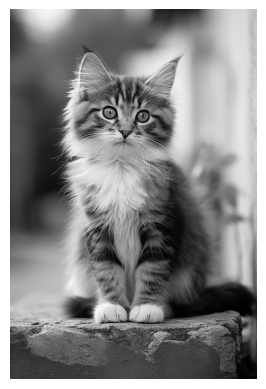

In [26]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

img = Image.open("gray_gpu.jpg")
arr = np.array(img)

print("MIN:", arr.min(), "MAX:", arr.max())

plt.imshow(img, cmap="gray", vmin=0, vmax=255)
plt.axis("off")


Day 2 code

In [27]:
%%writefile sobel.cu
#include <opencv2/opencv.hpp>
#include <cuda_runtime.h>
#include <iostream>

using namespace std;
using namespace cv;

/* ========== CUDA SOBEL KERNEL ========== */
__global__ void sobelKernel(unsigned char* input,
                            unsigned char* output,
                            int width, int height)
{
    int x = blockIdx.x * blockDim.x + threadIdx.x;
    int y = blockIdx.y * blockDim.y + threadIdx.y;

    if (x > 0 && x < width-1 && y > 0 && y < height-1)
    {
        int idx = y * width + x;

        int gx =
            -input[(y-1)*width + (x-1)] + input[(y-1)*width + (x+1)] +
            -2*input[y*width + (x-1)]   + 2*input[y*width + (x+1)] +
            -input[(y+1)*width + (x-1)] + input[(y+1)*width + (x+1)];

        int gy =
            -input[(y-1)*width + (x-1)] -2*input[(y-1)*width + x] -input[(y-1)*width + (x+1)] +
             input[(y+1)*width + (x-1)] +2*input[(y+1)*width + x] +input[(y+1)*width + (x+1)];

        int edge = abs(gx) + abs(gy);
        if (edge > 255) edge = 255;

        output[idx] = edge;
    }
}

/* ========== MAIN FUNCTION ========== */
int main()
{
    Mat gray = imread("input.jpg", IMREAD_GRAYSCALE);
    if (gray.empty())
    {
        cout << "Image not found!" << endl;
        return -1;
    }

    int width = gray.cols;
    int height = gray.rows;

    Mat edges(height, width, CV_8UC1);

    size_t size = width * height;

    unsigned char *d_input, *d_output;
    cudaMalloc(&d_input, size);
    cudaMalloc(&d_output, size);

    cudaMemcpy(d_input, gray.data, size, cudaMemcpyHostToDevice);

    dim3 threads(16, 16);
    dim3 blocks((width + 15) / 16, (height + 15) / 16);

    sobelKernel<<<blocks, threads>>>(d_input, d_output, width, height);
    cudaDeviceSynchronize();

    cudaMemcpy(edges.data, d_output, size, cudaMemcpyDeviceToHost);

    imwrite("edges_gpu.jpg", edges);

    cudaFree(d_input);
    cudaFree(d_output);

    cout << "Edge detection completed" << endl;
    return 0;
}


Writing sobel.cu


In [28]:
!nvcc sobel.cu -o sobel -arch=sm_75 `pkg-config --cflags --libs opencv4`


/usr/include/opencv4/opencv2/stitching/detail/warpers.hpp(235): warning #611-D: overloaded virtual function "cv::detail::PlaneWarper::buildMaps" is only partially overridden in class "cv::detail::AffineWarper"
  class AffineWarper : public PlaneWarper
        ^

Remark: The warnings can be suppressed with "-diag-suppress <warning-number>"

/usr/include/opencv4/opencv2/stitching/detail/warpers.hpp(235): warning #611-D: overloaded virtual function "cv::detail::PlaneWarper::warp" is only partially overridden in class "cv::detail::AffineWarper"
  class AffineWarper : public PlaneWarper
        ^

/usr/include/opencv4/opencv2/stitching/detail/blenders.hpp(100): warning #611-D: overloaded virtual function "cv::detail::Blender::prepare" is only partially overridden in class "cv::detail::FeatherBlender"
  class FeatherBlender : public Blender
        ^

/usr/include/opencv4/opencv2/stitching/detail/blenders.hpp(127): warning #611-D: overloaded virtual function "cv::detail::Blender::prepare" is

In [29]:
!./sobel


Edge detection completed


(np.float64(-0.5), np.float64(3583.5), np.float64(5375.5), np.float64(-0.5))

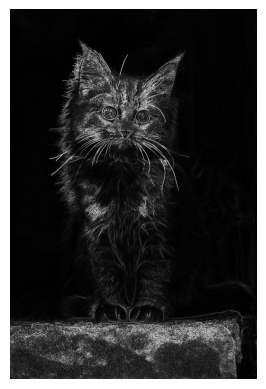

In [30]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open("edges_gpu.jpg")
plt.imshow(img, cmap="gray")
plt.axis("off")
